<a href="https://colab.research.google.com/github/ritwiks9635/CNN_Project_File/blob/main/Cars_And_Bikes_classification_ipynb_txt.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
https://www.kaggle.com/datasets/utkarshsaxenadn/car-vs-bike-classification-dataset

In [ ]:
! unzip /content/https:/www.kaggle.com/datasets/utkarshsaxenadn/car-vs-bike-classification-dataset/car-vs-bike-classification-dataset.zip

# Čars🚓🚔🚕🚖🚗🚘🚙🏎and Bikes🏍🛵🛴🏍🏍🏍🏍🛵🛵🛵🛵🛵🛵Classification

In [ ]:
import numpy as np
from PIL import Image
import tensorflow as tf
import matplotlib.pyplot as plt
from IPython.display import clear_output as cls

In [ ]:
data_dir = "/content/Car-Bike-Dataset"
os.listdir(data_dir)

['Car', 'Bike']

In [ ]:
os.listdir(cars)

['Car (1244).jpeg',
 'Car (352).jpeg',
 'Car (1739).jpeg',
 'Car (896).jpeg',
 'Car (1707).jpeg',
 'Car (1597).jpeg',
 'Car (992).jpeg',
 'Car (1874).jpeg',
 'Car (1220).jpeg',
 'Car (543).jpeg',
 'Car (1598).jpeg',
 'Car (17).jpg',
 'Car (437).jpeg',
 'Car (1826).jpeg',
 'Car (1887).jpeg',
 'Car (38).jpeg',
 'Car (713).jpeg',
 'Car (1919).jpeg',
 'Car (754).jpeg',
 'Car (167).jpeg',
 'Car (1058).jpeg',
 'Car (1164).jpeg',
 'Car (1346).jpeg',
 'Car (1712).jpeg',
 'Car (648).jpeg',
 'Car (1495).jpeg',
 'Car (915).jpeg',
 'Car (143).jpeg',
 'Car (1263).jpeg',
 'Car (278).jpeg',
 'Car (921).jpeg',
 'Car (11).jpg',
 'Car (1276).jpeg',
 'Car (260).jpeg',
 'Car (567).jpeg',
 'Car (773).jpeg',
 'Car (1601).jpeg',
 'Car (145).jpeg',
 'Car (965).jpeg',
 'Car (509).jpeg',
 'Car (176).jpeg',
 'Car (433).jpeg',
 'Car (1431).jpeg',
 'Car (1904).jpeg',
 'Car (1127).jpeg',
 'Car (729).jpeg',
 'Car (776).jpeg',
 'Car (1435).jpeg',
 'Car (428).jpeg',
 'Car (1321).jpeg',
 'Car (1354).jpeg',
 'Car (1227)

In [ ]:
cars = os.path.join(data_dir, 'Car')
bikes = os.path.join(data_dir, 'Bike')
cars_d = os.listdir(cars)
bikes_d = os.listdir(bikes)

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
train_gen = ImageDataGenerator(
    rescale = 1./255.,
    zoom_range=0.2,
    shear_range = 0.2,
    rotation_range = 40,
    width_shift_range = 0.2,
    height_shift_range = 0.2,
    horizontal_flip = True,
    validation_split=0.2)

In [ ]:
train_data = train_gen.flow_from_directory(
    data_dir,
    batch_size = 32,
    class_mode = "binary",
    shuffle = True,
    subset="training",
    target_size = (256, 256))

val_data = train_gen.flow_from_directory(
    data_dir,
    batch_size = 32,
    class_mode = "binary",
    shuffle = True,
    subset="validation",
    target_size = (256, 256))

Found 3200 images belonging to 2 classes.
Found 800 images belonging to 2 classes.


In [ ]:
x, y = next(train_data)

In [ ]:
a = train_data.class_indices
a

{'Bike': 0, 'Car': 1}

In [ ]:
classes = list(a.keys())

In [ ]:
classes

['Bike', 'Car']

In [ ]:
def show_images(GRID=[5,5], model=None, size=(20,20), data=train_data):
    n_rows = GRID[0]
    n_cols = GRID[1]
    n_images = n_cols * n_rows

    i = 1
    plt.figure(figsize=size)
    for images, labels in data:
        id = np.random.randint(len(images))
        image, label = images[id], classes[int(labels[id])]

        plt.subplot(n_rows, n_cols, i)
        plt.imshow(image)

        if model is None:
            title = f"Class : {label}"
        else:
            pred = classes[int(np.argmax(model.predict(image[np.newaxis, ...])))]
            title = f"Org : {label}, Pred : {pred}"
            cls()

        plt.title(title)
        plt.axis('off')

        i+=1
        if i>=(n_images+1):
            break

    plt.tight_layout()
    plt.show()

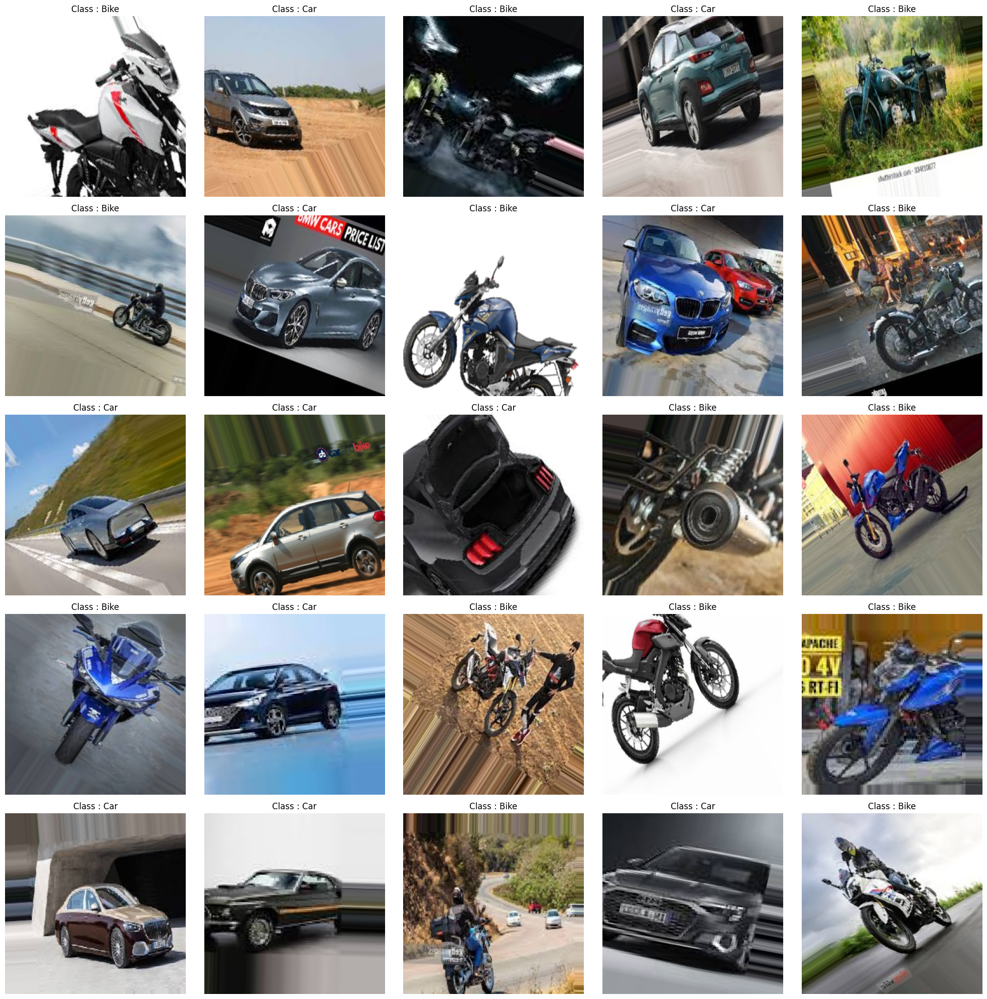

In [ ]:
show_images()

In [ ]:
!wget --no-check-certificate \
    https://storage.googleapis.com/mledu-datasets/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5 \
    -O /tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5

--2023-08-08 16:04:25--  https://storage.googleapis.com/mledu-datasets/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5
Resolving storage.googleapis.com (storage.googleapis.com)... 142.250.99.128, 74.125.199.128, 142.250.107.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|142.250.99.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 87910968 (84M) [application/x-hdf]
Saving to: ‘/tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5’

/tmp/inception_v3_w 100%[===================>]  83.84M   249MB/s    in 0.3s    

2023-08-08 16:04:25 (249 MB/s) - ‘/tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5’ saved [87910968/87910968]



In [ ]:
base_model = tf.keras.applications.InceptionV3(include_top=False, input_shape = (256, 256, 3), weights = None)
weights = '/tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5'
base_model.load_weights(weights)

In [ ]:
for layer in base_model.layers:
  layer.trainable = False

In [ ]:
base_model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_94 (Conv2D)             (None, 127, 127, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_94 (BatchN  (None, 127, 127, 32  96         ['conv2d_94[0][0]']              
 ormalization)                  )                                                      

In [ ]:
last_layer = base_model.get_layer("mixed7")
print(last_layer.output_shape)
last_output = last_layer.output

(None, 14, 14, 768)


In [ ]:
len(classes)

2

In [ ]:
x = tf.keras.layers.Flatten()(last_output)
x = tf.keras.layers.Dense(1024, activation = "relu", kernel_initializer='he_normal')(x)
x = tf.keras.layers.Dropout(0.2)(x)
output = tf.keras.layers.Dense(len(classes))(x)
model = tf.keras.Model(inputs = base_model.input, outputs = output)

In [ ]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_94 (Conv2D)             (None, 127, 127, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_94 (BatchN  (None, 127, 127, 32  96         ['conv2d_94[0][0]']              
 ormalization)                  )                                                           

In [ ]:
model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics = ["accuracy"])

In [ ]:
E_S = tf.keras.callbacks.EarlyStopping(patience=3, restore_best_weights=True)
M_C = tf.keras.callbacks.ModelCheckpoint("model.h5", save_best_only=True)

In [ ]:
history = model.fit(train_data, epochs = 50, validation_data = val_data, callbacks = [E_S, M_C])

Epoch 1/50
100/100 [==============================] - 95s 897ms/step - loss: 0.1997 - accuracy: 0.9422 - val_loss: 0.0746 - val_accuracy: 0.9712
Epoch 2/50
100/100 [==============================] - 91s 909ms/step - loss: 0.0581 - accuracy: 0.9822 - val_loss: 0.0629 - val_accuracy: 0.9762
Epoch 3/50
100/100 [==============================] - 88s 878ms/step - loss: 0.0639 - accuracy: 0.9772 - val_loss: 0.0432 - val_accuracy: 0.9825
Epoch 4/50
100/100 [==============================] - 69s 690ms/step - loss: 0.0694 - accuracy: 0.9772 - val_loss: 0.1578 - val_accuracy: 0.9600
Epoch 5/50
100/100 [==============================] - 67s 674ms/step - loss: 0.0353 - accuracy: 0.9887 - val_loss: 0.0590 - val_accuracy: 0.9762
Epoch 6/50
100/100 [==============================] - 76s 758ms/step - loss: 0.0383 - accuracy: 0.9872 - val_loss: 0.0947 - val_accuracy: 0.9787


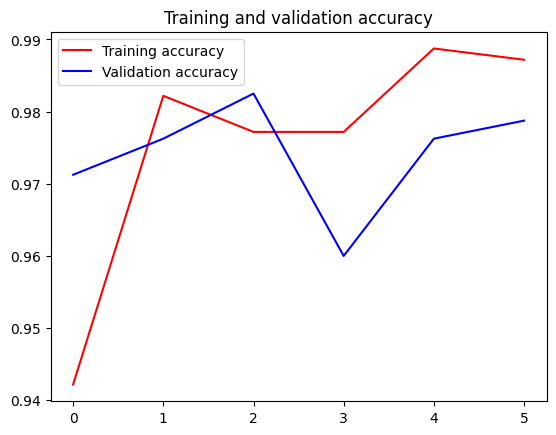

<Figure size 640x480 with 0 Axes>

In [ ]:
import matplotlib.pyplot as plt
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend(loc=0)
plt.figure()


plt.show()

In [ ]:
a

{'Bike': 0, 'Car': 1}

In [ ]:
from google.colab import files
from tensorflow.keras.utils import load_img, img_to_array

uploaded = files.upload()

for fn in uploaded.keys():

  # predicting images
  path = fn
  img = load_img(path, target_size=(180, 180))
  x = img_to_array(img)
  x = np.expand_dims(x, axis=0)

  images = np.hstack([x])
  classes = model.predict(images, batch_size=32)
  print(fn)
  print(classes)

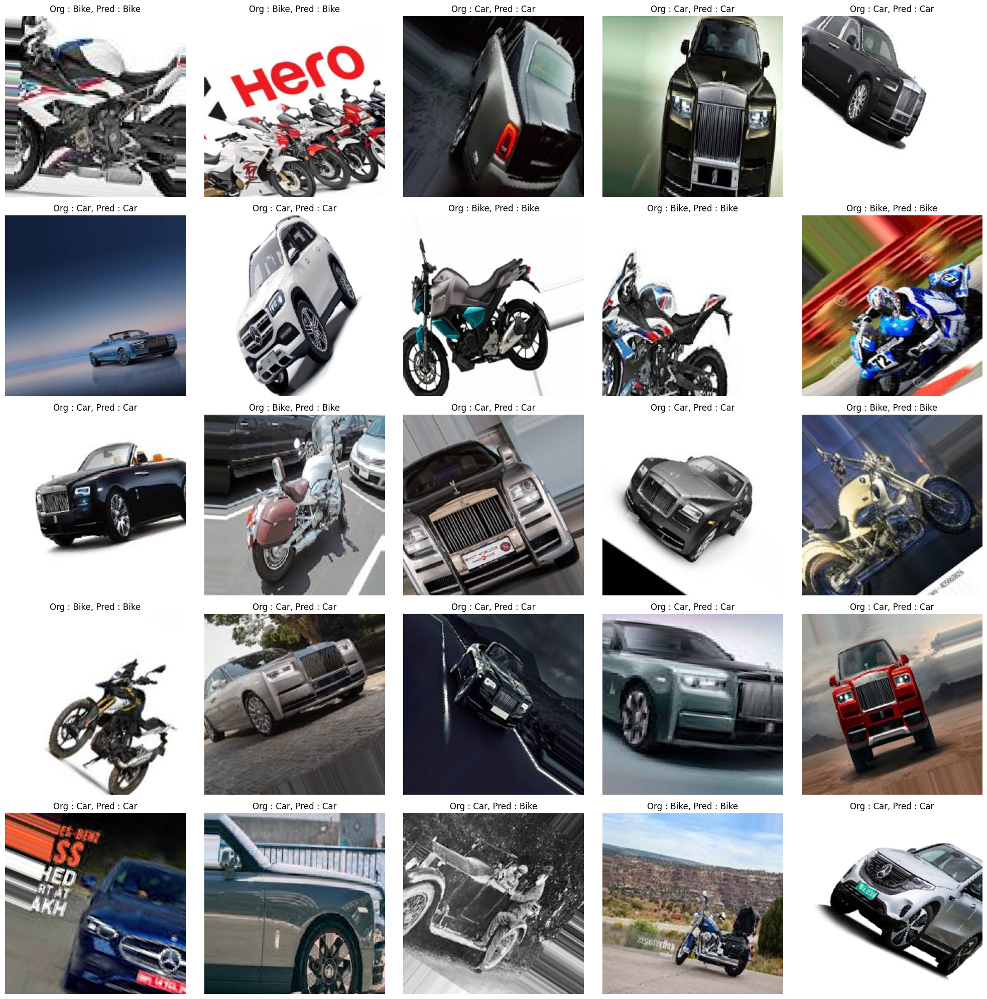

In [ ]:
show_images(model = model, data = val_data)